<a href="https://colab.research.google.com/github/Tbarkin121/ML_Examples/blob/main/Acrobot_Actor_Critic_NoGradTape.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://adventuresinmachinelearning.com/a2c-advantage-actor-critic-tensorflow-2/

In [46]:
import math
th1 = (180)*3.1415/180
th2 = (0)*3.1415/180

s1 = math.cos(th1)
s2 = math.sin(th1)
s3 = math.cos(th2)
s4 = math.sin(th2)
x0 = 0
y0 = 0
x1 = x0 + math.sin(th1)
y1 = y0 - math.cos(th1)
x2 = x1 + math.sin(th1+th2)
y2 = y1 - math.cos(th1+th2)
print('(x0,y0) = ({},{})'.format(x0,y0))
print('(x1,y1) = ({},{})'.format(x1,y1))
print('(x2,y2) = ({},{})'.format(x2,y2))

(x0,y0) = (0,0)
(x1,y1) = (9.265358966049026e-05,0.9999999957076562)
(x2,y2) = (0.00018530717932098052,1.9999999914153124)


In [47]:
 """classic Acrobot task"""
import numpy as np
from numpy import sin, cos, pi

from gym import core, spaces
from gym.utils import seeding

__copyright__ = "Copyright 2013, RLPy http://acl.mit.edu/RLPy"
__credits__ = ["Alborz Geramifard", "Robert H. Klein", "Christoph Dann",
               "William Dabney", "Jonathan P. How"]
__license__ = "BSD 3-Clause"
__author__ = "Christoph Dann <cdann@cdann.de>"

# SOURCE:
# https://github.com/rlpy/rlpy/blob/master/rlpy/Domains/Acrobot.py

class AcrobotEnv(core.Env):

    """
    Acrobot is a 2-link pendulum with only the second joint actuated.
    Initially, both links point downwards. The goal is to swing the
    end-effector at a height at least the length of one link above the base.
    Both links can swing freely and can pass by each other, i.e., they don't
    collide when they have the same angle.
    **STATE:**
    The state consists of the sin() and cos() of the two rotational joint
    angles and the joint angular velocities :
    [cos(theta1) sin(theta1) cos(theta2) sin(theta2) thetaDot1 thetaDot2].
    For the first link, an angle of 0 corresponds to the link pointing downwards.
    The angle of the second link is relative to the angle of the first link.
    An angle of 0 corresponds to having the same angle between the two links.
    A state of [1, 0, 1, 0, ..., ...] means that both links point downwards.
    **ACTIONS:**
    The action is either applying +1, 0 or -1 torque on the joint between
    the two pendulum links.
    .. note::
        The dynamics equations were missing some terms in the NIPS paper which
        are present in the book. R. Sutton confirmed in personal correspondence
        that the experimental results shown in the paper and the book were
        generated with the equations shown in the book.
        However, there is the option to run the domain with the paper equations
        by setting book_or_nips = 'nips'
    **REFERENCE:**
    .. seealso::
        R. Sutton: Generalization in Reinforcement Learning:
        Successful Examples Using Sparse Coarse Coding (NIPS 1996)
    .. seealso::
        R. Sutton and A. G. Barto:
        Reinforcement learning: An introduction.
        Cambridge: MIT press, 1998.
    .. warning::
        This version of the domain uses the Runge-Kutta method for integrating
        the system dynamics and is more realistic, but also considerably harder
        than the original version which employs Euler integration,
        see the AcrobotLegacy class.
    """

    metadata = {
        'render.modes': ['human', 'rgb_array'],
        'video.frames_per_second' : 15
    }

    dt = .2

    LINK_LENGTH_1 = 1.  # [m]
    LINK_LENGTH_2 = 1.  # [m]
    LINK_MASS_1 = 1.  #: [kg] mass of link 1
    LINK_MASS_2 = 1.  #: [kg] mass of link 2
    LINK_COM_POS_1 = 0.5  #: [m] position of the center of mass of link 1
    LINK_COM_POS_2 = 0.5  #: [m] position of the center of mass of link 2
    LINK_MOI = 1.  #: moments of inertia for both links

    MAX_VEL_1 = 4 * pi
    MAX_VEL_2 = 9 * pi

    AVAIL_TORQUE = [-1., 0., +1]

    torque_noise_max = 0.

    #: use dynamics equations from the nips paper or the book
    book_or_nips = "book"
    action_arrow = None
    domain_fig = None
    actions_num = 3

    def __init__(self):
        self.viewer = None
        high = np.array([1.0, 1.0, 1.0, 1.0, self.MAX_VEL_1, self.MAX_VEL_2], dtype=np.float32)
        low = -high
        self.observation_space = spaces.Box(low=low, high=high, dtype=np.float32)
        self.action_space = spaces.Discrete(3)
        self.state = None
        self.seed()

    def seed(self, seed=None):
        self.np_random, seed = seeding.np_random(seed)
        return [seed]

    def reset(self):
        self.state = self.np_random.uniform(low=-0.1, high=0.1, size=(4,))
        return self._get_ob()

    def step(self, a):
        s = self.state
        torque = self.AVAIL_TORQUE[a]

        # Add noise to the force action
        if self.torque_noise_max > 0:
            torque += self.np_random.uniform(-self.torque_noise_max, self.torque_noise_max)

        # Now, augment the state with our force action so it can be passed to
        # _dsdt
        s_augmented = np.append(s, torque)

        ns = rk4(self._dsdt, s_augmented, [0, self.dt])
        # only care about final timestep of integration returned by integrator
        ns = ns[-1]
        ns = ns[:4]  # omit action
        # ODEINT IS TOO SLOW!
        # ns_continuous = integrate.odeint(self._dsdt, self.s_continuous, [0, self.dt])
        # self.s_continuous = ns_continuous[-1] # We only care about the state
        # at the ''final timestep'', self.dt

        ns[0] = wrap(ns[0], -pi, pi)
        ns[1] = wrap(ns[1], -pi, pi)
        ns[2] = bound(ns[2], -self.MAX_VEL_1, self.MAX_VEL_1)
        ns[3] = bound(ns[3], -self.MAX_VEL_2, self.MAX_VEL_2)
        self.state = ns
        # terminal = self._terminal()
        terminal = False
        x0 = 0
        y0 = 0
        x1 = x0 + math.sin(ns[0])
        y1 = y0 - math.cos(ns[0])
        x2 = x1 + math.sin(ns[0]+ns[1])
        y2 = y1 - math.cos(ns[0]+ns[1])
        r = y2/(self.LINK_LENGTH_1 + self.LINK_LENGTH_2)
        reward = r 
        if (terminal):
          reward = 0
        return (self._get_ob(), reward, terminal, {})

    def _get_ob(self):
        s = self.state
        return np.array([cos(s[0]), sin(s[0]), cos(s[1]), sin(s[1]), s[2], s[3]])

    def _terminal(self):
        s = self.state
        return bool(-cos(s[0]) - cos(s[1] + s[0]) > 1.)

    def _dsdt(self, s_augmented, t):
        m1 = self.LINK_MASS_1
        m2 = self.LINK_MASS_2
        l1 = self.LINK_LENGTH_1
        lc1 = self.LINK_COM_POS_1
        lc2 = self.LINK_COM_POS_2
        I1 = self.LINK_MOI
        I2 = self.LINK_MOI
        g = 9.8
        a = s_augmented[-1]
        s = s_augmented[:-1]
        theta1 = s[0]
        theta2 = s[1]
        dtheta1 = s[2]
        dtheta2 = s[3]
        d1 = m1 * lc1 ** 2 + m2 * \
            (l1 ** 2 + lc2 ** 2 + 2 * l1 * lc2 * cos(theta2)) + I1 + I2
        d2 = m2 * (lc2 ** 2 + l1 * lc2 * cos(theta2)) + I2
        phi2 = m2 * lc2 * g * cos(theta1 + theta2 - pi / 2.)
        phi1 = - m2 * l1 * lc2 * dtheta2 ** 2 * sin(theta2) \
               - 2 * m2 * l1 * lc2 * dtheta2 * dtheta1 * sin(theta2)  \
            + (m1 * lc1 + m2 * l1) * g * cos(theta1 - pi / 2) + phi2
        if self.book_or_nips == "nips":
            # the following line is consistent with the description in the
            # paper
            ddtheta2 = (a + d2 / d1 * phi1 - phi2) / \
                (m2 * lc2 ** 2 + I2 - d2 ** 2 / d1)
        else:
            # the following line is consistent with the java implementation and the
            # book
            ddtheta2 = (a + d2 / d1 * phi1 - m2 * l1 * lc2 * dtheta1 ** 2 * sin(theta2) - phi2) \
                / (m2 * lc2 ** 2 + I2 - d2 ** 2 / d1)
        ddtheta1 = -(d2 * ddtheta2 + phi1) / d1
        return (dtheta1, dtheta2, ddtheta1, ddtheta2, 0.)

    def render(self, mode='human'):
        from gym.envs.classic_control import rendering

        s = self.state

        if self.viewer is None:
            self.viewer = rendering.Viewer(500,500)
            bound = self.LINK_LENGTH_1 + self.LINK_LENGTH_2 + 0.2  # 2.2 for default
            self.viewer.set_bounds(-bound,bound,-bound,bound)

        if s is None: return None

        p1 = [-self.LINK_LENGTH_1 *
              cos(s[0]), self.LINK_LENGTH_1 * sin(s[0])]

        p2 = [p1[0] - self.LINK_LENGTH_2 * cos(s[0] + s[1]),
              p1[1] + self.LINK_LENGTH_2 * sin(s[0] + s[1])]

        xys = np.array([[0,0], p1, p2])[:,::-1]
        thetas = [s[0]- pi/2, s[0]+s[1]-pi/2]
        link_lengths = [self.LINK_LENGTH_1, self.LINK_LENGTH_2]

        self.viewer.draw_line((-2.2, 1), (2.2, 1))
        for ((x,y),th,llen) in zip(xys, thetas, link_lengths):
            l,r,t,b = 0, llen, .1, -.1
            jtransform = rendering.Transform(rotation=th, translation=(x,y))
            link = self.viewer.draw_polygon([(l,b), (l,t), (r,t), (r,b)])
            link.add_attr(jtransform)
            link.set_color(0,.8, .8)
            circ = self.viewer.draw_circle(.1)
            circ.set_color(.8, .8, 0)
            circ.add_attr(jtransform)

        return self.viewer.render(return_rgb_array = mode=='rgb_array')

    def close(self):
        if self.viewer:
            self.viewer.close()
            self.viewer = None

def wrap(x, m, M):
    """Wraps ``x`` so m <= x <= M; but unlike ``bound()`` which
    truncates, ``wrap()`` wraps x around the coordinate system defined by m,M.\n
    For example, m = -180, M = 180 (degrees), x = 360 --> returns 0.
    Args:
        x: a scalar
        m: minimum possible value in range
        M: maximum possible value in range
    Returns:
        x: a scalar, wrapped
    """
    diff = M - m
    while x > M:
        x = x - diff
    while x < m:
        x = x + diff
    return x

def bound(x, m, M=None):
    """Either have m as scalar, so bound(x,m,M) which returns m <= x <= M *OR*
    have m as length 2 vector, bound(x,m, <IGNORED>) returns m[0] <= x <= m[1].
    Args:
        x: scalar
    Returns:
        x: scalar, bound between min (m) and Max (M)
    """
    if M is None:
        M = m[1]
        m = m[0]
    # bound x between min (m) and Max (M)
    return min(max(x, m), M)


def rk4(derivs, y0, t, *args, **kwargs):
    """
    Integrate 1D or ND system of ODEs using 4-th order Runge-Kutta.
    This is a toy implementation which may be useful if you find
    yourself stranded on a system w/o scipy.  Otherwise use
    :func:`scipy.integrate`.
    Args:
        derivs: the derivative of the system and has the signature ``dy = derivs(yi, ti)``
        y0: initial state vector
        t: sample times
        args: additional arguments passed to the derivative function
        kwargs: additional keyword arguments passed to the derivative function
    Example 1 ::
        ## 2D system
        def derivs6(x,t):
            d1 =  x[0] + 2*x[1]
            d2 =  -3*x[0] + 4*x[1]
            return (d1, d2)
        dt = 0.0005
        t = arange(0.0, 2.0, dt)
        y0 = (1,2)
        yout = rk4(derivs6, y0, t)
    Example 2::
        ## 1D system
        alpha = 2
        def derivs(x,t):
            return -alpha*x + exp(-t)
        y0 = 1
        yout = rk4(derivs, y0, t)
    If you have access to scipy, you should probably be using the
    scipy.integrate tools rather than this function.
    Returns:
        yout: Runge-Kutta approximation of the ODE
    """

    try:
        Ny = len(y0)
    except TypeError:
        yout = np.zeros((len(t),), np.float_)
    else:
        yout = np.zeros((len(t), Ny), np.float_)

    yout[0] = y0


    for i in np.arange(len(t) - 1):

        thist = t[i]
        dt = t[i + 1] - thist
        dt2 = dt / 2.0
        y0 = yout[i]

        k1 = np.asarray(derivs(y0, thist, *args, **kwargs))
        k2 = np.asarray(derivs(y0 + dt2 * k1, thist + dt2, *args, **kwargs))
        k3 = np.asarray(derivs(y0 + dt2 * k2, thist + dt2, *args, **kwargs))
        k4 = np.asarray(derivs(y0 + dt * k3, thist + dt, *args, **kwargs))
        yout[i + 1] = y0 + dt / 6.0 * (k1 + 2 * k2 + 2 * k3 + k4)
    return yout


In [48]:
%matplotlib inline
!pip install stable-baselines3[extra]

In [49]:
%%bash
# Install additional packages for visualization
sudo apt-get install -y xvfb python-opengl > /dev/null 2>&1
pip install pyvirtualdisplay > /dev/null 2>&1
pip install git+https://github.com/tensorflow/docs > /dev/null 2>&1

In [50]:
import time
import datetime, os

import collections
import gym
import numpy as np
import statistics
import tensorflow as tf
import tqdm

from matplotlib import pyplot as plt
from tensorflow.keras import layers
from typing import Any, List, Sequence, Tuple

from collections import namedtuple, deque
import random

# Set seed for experiment reproducibility
# seed = 66
seed = 8675302
tf.random.set_seed(seed)
np.random.seed(seed)
random.seed(seed)
# Small epsilon value for stabilizing division operations
eps = np.finfo(np.float32).eps.item()

In [51]:
# Create the environment
# env = gym.make("Acrobot-v1")
env = AcrobotEnv()
env.seed(seed)

# Box(4,) means that it is a Vector with 4 components
print("Observation space:", env.observation_space)
print("Shape:", env.observation_space.shape[0])
# Discrete(2) means that there is two discrete actions
print("Action space:", env.action_space)

# Wrap OpenAI Gym's `env.step` call as an operation in a TensorFlow function.
# This would allow it to be included in a callable TensorFlow graph.

def env_step(action: np.ndarray) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
  """Returns state, reward and done flag given an action."""

  state, reward, done, _ = env.step(action)
  return (state.astype(np.float32), np.array(reward, np.float32), np.array(done, np.int32))


def tf_env_step(action: tf.Tensor) -> List[tf.Tensor]:
  return tf.numpy_function(env_step, [action], [tf.float32, tf.float32, tf.int32])
  

num_obs = env.observation_space.shape[0]
num_actions = env.action_space.n

print('num_obs = {}'.format(num_obs))
print('num_actions = {}'.format(num_actions))


Observation space: Box(-28.274333953857422, 28.274333953857422, (6,), float32)
Shape: 6
Action space: Discrete(3)
num_obs = 6
num_actions = 3


In [52]:
Transition = namedtuple('Transition',
                        ('state', 'action', 'next_state', 'reward', 'done'))

class ExperienceReplay(object):

    def __init__(self, capacity):
        self.memory = deque([],maxlen=capacity)

    def push(self, *args):
        """Save a transition"""
        self.memory.append(Transition(*args))

    def sample(self, batch_size):
        return random.sample(self.memory, batch_size)

    def __len__(self):
        return len(self.memory)

In [53]:
class ActorNet(tf.keras.Model):
  """Actor network."""
  def __init__(self, num_actions: int, num_hidden_units: int):
    """Initialize."""
    super().__init__()
    # self.actor_input = layers.Input(shape=(4))
    self.d1 = layers.Dense(num_hidden_units)
    self.lr1 = layers.LeakyReLU()
    self.d2 = layers.Dense(num_hidden_units)
    self.lr2 = layers.LeakyReLU()
    # self.a = layers.Dense(num_actions, activation='softmax')
    self.a = layers.Dense(num_actions, activation='tanh')
    # self.a = layers.Dense(num_actions, activation='sigmoid')
    # self.a = layers.Dense(num_actions)
    

  def call(self, inputs: tf.Tensor) -> Tuple[tf.Tensor, tf.Tensor]:
    x = self.d1(inputs)
    # x = tf.keras.activations.tanh(x)
    x = self.lr1(x)
    x = self.d2(x)
    x = self.lr2(x)
    return self.a(x)


class CriticNet(tf.keras.Model):
  """Critic network."""
  def __init__(self, num_actions:int, num_hidden_units: int):
    """Initialize."""
    super().__init__()
    # self.critic_input = layers.Input(shape=(4))
    self.d1 = layers.Dense(num_hidden_units)
    self.lr1 = layers.LeakyReLU()
    self.d2 = layers.Dense(num_hidden_units)
    self.lr2 = layers.LeakyReLU()
    # self.critic = layers.Dense(num_actions)
    self.c = layers.Dense(1)

  def call(self, inputs: tf.Tensor) -> Tuple[tf.Tensor, tf.Tensor]:
    x = self.d1(inputs)
    # x = tf.keras.activations.tanh(x)
    x = self.lr1(x)
    x = self.d2(x)
    x = self.lr2(x)
    return self.c(x)

In [54]:
class Agent():
    def __init__(self, gamma = 0.99, mem_size = 100000, batch_size = 1024, mini_batch_size = 128, n_mini_batches=1):
        self.gamma = gamma
        self.mem_size = mem_size
        self.batch_size = batch_size
        self.mini_batch_size = mini_batch_size
        self.n_mini_batches = n_mini_batches
        self.memory = ExperienceReplay(self.mem_size)

        self.a_opt = tf.keras.optimizers.Adam(learning_rate=1e-3)
        self.c_opt = tf.keras.optimizers.Adam(learning_rate=1e-3)


        self.actor = ActorNet(num_actions, 32)
        self.critic = CriticNet(num_actions, 32)

        self.actor.compile(
                    optimizer='adam')

        self.critic.compile(
                    optimizer='adam')
        
        self.huber_loss = tf.keras.losses.Huber(reduction=tf.keras.losses.Reduction.SUM)

        self.I = 1
        # Define our metrics
        self.actor_loss_metric = tf.keras.metrics.Mean('actor_loss', dtype=tf.float32)
        self.critic_loss_metric = tf.keras.metrics.Mean('critic_loss', dtype=tf.float32)
        self.logits1_metric = tf.keras.metrics.Mean('logits1', dtype=tf.float32)
        self.logits2_metric = tf.keras.metrics.Mean('logits2', dtype=tf.float32)
        self.probs1_metric = tf.keras.metrics.Mean('probs1', dtype=tf.float32)
        self.probs2_metric = tf.keras.metrics.Mean('probs2', dtype=tf.float32)
        
        # train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy('train_accuracy')
        # test_accuracy = tf.keras.metrics.SparseCategoricalAccuracy('test_accuracy')
          
    def act(self, state, deterministic=False):
        logits = self.actor(state)
        if (deterministic):
            action = tf.argmax(logits, 1)[0]
        else:
            # action = tf.random.categorical(logits, 1)[0, 0]
            # print('logits a = {}'.format(logits))
            # logits = logits + 0.1
            # print('logits b = {}'.format(logits))
            probs = tf.nn.softmax(logits)
            log_probs = tf.math.log(probs)
            action = tf.random.categorical(log_probs, 1)[0, 0]
        return action
    def reset_replay_buffer(self):
        # Reset memory buffer
        self.memory = ExperienceReplay(self.mem_size)
    
    def fill_replay_buff(self, n_samples):        
        # Reset Environment
        state = tf.constant(env.reset(), dtype=tf.float32)
        # Convert state into a batched tensor (batch size = 1)
        state = tf.expand_dims(state, 0)
        for i in range(n_samples):
          # Run the model and to get action probabilities and critic value
          action = self.act(state)

          # print('action = {}'.format(action))
          # Apply action to the environment to get next state and reward
          next_state, reward, done = tf_env_step(action)
          next_state = tf.expand_dims(next_state, 0)
        
          # print('next_state = {}'.format(next_state))
          # print('reward = {}'.format(reward))
          # print('done = {}'.format(done))
          # Store the transition in memory
          # print('')
          #If Episode is done, reset the environment
          if tf.cast(done, tf.bool):
            self.memory.push(state, action, next_state, 0, done)
            state = tf.constant(env.reset(), dtype=tf.float32)
            state = tf.expand_dims(state, 0)
          else:
            self.memory.push(state, action, next_state, reward, done)
            state=next_state

    # @tf.function
    def train(self, n_mini_batches = 1):
        self.fill_replay_buff(self.batch_size)
        for _ in range(n_mini_batches):
            mini_batch = self.memory.sample(self.mini_batch_size)
            # mini_batch = list(agent.memory.memory)[0:self.mini_batch_size]
            mini_batch = Transition(*zip(*mini_batch))
            state_t1 = tf.reshape(mini_batch[0], shape=(self.mini_batch_size, num_obs))
            action_t1 = tf.reshape(mini_batch[1], shape=(self.mini_batch_size, 1))
            state_t2 = tf.reshape(mini_batch[2], shape=(self.mini_batch_size, num_obs))
            reward_t2 = tf.reshape(mini_batch[3], shape=(self.mini_batch_size, 1))
            done = tf.reshape(mini_batch[4], shape=(self.mini_batch_size, 1))
            
            with tf.GradientTape() as tape1, tf.GradientTape() as tape2:
                logits = self.actor(state_t1, training=True)
                values_t1 = self.critic(state_t1, training=True)
                values_t2 = self.critic(state_t2, training=True)
                # print('logits = {}'.format(logits))
                # print('action_t1 = {}'.format(action_t1))
                
                # print('logit_actions = {}'.format(logit_actions))
                # print('logit_actions.shape = {}'.format(logit_actions.shape))
                # time.sleep(5)

                probs = tf.nn.softmax(logits)
                l = logits.numpy()
                p = probs.numpy()
                self.logits1_metric(l[0])
                self.logits2_metric(l[1])
                self.probs1_metric(p[0])
                self.probs2_metric(p[1])

                probs_actions = tf.gather(probs, action_t1, axis=1, batch_dims=1)
                log_probs = tf.math.log(probs_actions)
                # print('probs_actions = {}'.format(probs_actions))
                # print('probs_actions.shape = {}'.format(probs_actions.shape))
                # print('log_probs = {}'.format(log_probs))
                # print('log_probs.shape = {}'.format(log_probs.shape))
                # time.sleep(5)

                returns = (tf.cast(reward_t2, 'float32')) + self.gamma*values_t2*(1-tf.cast(done, 'float32'))
                # returns = -tf.cast(done, 'float32') + self.gamma*values_t2*(1-tf.cast(done, 'float32'))
                advantage =  returns - values_t1 

                entropy_loss = -tf.math.reduce_mean(probs_actions*log_probs)
                # actor_loss = -log_probs*advantage
                # actor_loss = tf.math.reduce_mean(-self.I*log_probs * advantage) - 0.00001*entropy_loss
                actor_loss = tf.math.reduce_mean(-log_probs * advantage) - 0.0001*entropy_loss
                self.I *= self.gamma
                critic_loss = 0.5*self.huber_loss(values_t1, returns)
                # critic_loss = 0.5*tf.math.reduce_mean(advantage**2)

                
                
            grads1 = tape1.gradient(actor_loss, self.actor.trainable_variables)
            grads2 = tape2.gradient(critic_loss, self.critic.trainable_variables)

            self.a_opt.apply_gradients(zip(grads1, self.actor.trainable_variables))
            self.c_opt.apply_gradients(zip(grads2, self.critic.trainable_variables))

            self.actor_loss_metric(actor_loss)
            self.critic_loss_metric(critic_loss)

        # return actor_loss, critic_loss
    def summary(self):
        pass
        # state = tf.constant(env.reset(), dtype=tf.float32)
        # state = tf.expand_dims(state, 0)
        # self.actor.build(input_shape=(1,4))
        # self.actor.summary()
        # self.critic.build(input_shape=(1,4))
        # self.critic.summary()

In [35]:
agent = Agent(mem_size=3, batch_size=100, mini_batch_size=3, n_mini_batches=10)
agent.reset_replay_buffer()
agent.fill_replay_buff(3)

state = tf.constant(env.reset(), dtype=tf.float32)
state = tf.expand_dims(state, 0)
print(state)

print(agent.memory.memory)
# output = agent.actor(state)
# output2 = agent.critic(state)
# print(output)
# print(output2)

tf.Tensor([[ 0.9999514   0.00985553  0.99878186 -0.04934392  0.00744009 -0.03952479]], shape=(1, 6), dtype=float32)
deque([Transition(state=<tf.Tensor: shape=(1, 6), dtype=float32, numpy=
array([[ 0.998743  ,  0.0501239 ,  0.99862266, -0.05246729,  0.02428079,
         0.03272063]], dtype=float32)>, action=<tf.Tensor: shape=(), dtype=int64, numpy=1>, next_state=<tf.Tensor: shape=(1, 6), dtype=float32, numpy=
array([[ 0.9988582 ,  0.04777333,  0.9993517 , -0.03600354, -0.04674309,
         0.12873887]], dtype=float32)>, reward=<tf.Tensor: shape=(), dtype=float32, numpy=-0.9993944>, done=<tf.Tensor: shape=(), dtype=int32, numpy=0>), Transition(state=<tf.Tensor: shape=(1, 6), dtype=float32, numpy=
array([[ 0.9988582 ,  0.04777333,  0.9993517 , -0.03600354, -0.04674309,
         0.12873887]], dtype=float32)>, action=<tf.Tensor: shape=(), dtype=int64, numpy=1>, next_state=<tf.Tensor: shape=(1, 6), dtype=float32, numpy=
array([[ 0.99947095,  0.03252494,  0.99999434, -0.00336104, -0.10169999,

In [ ]:
# agent = Agent(mem_size=3, batch_size=100, mini_batch_size=10, n_mini_batches=10)
# agent.reset_replay_buffer()
# agent.fill_replay_buff(3)
# # agent.summary()

# for i in range(len(agent.memory)):
#   print('mem = {}'.format(i))
#   print(agent.memory.memory[i][0])

# agent.fill_replay_buff(1)

# for i in range(len(agent.memory)):
#   print('mem = {}'.format(i))
#   print(agent.memory.memory[i][0])



In [59]:
agent = Agent(mem_size=100000, gamma=0.99, batch_size=500, mini_batch_size=10000, n_mini_batches=10)
agent.fill_replay_buff(10000)

In [74]:
import datetime

reward_metric = tf.keras.metrics.Mean('reward', dtype=tf.float32)

current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
grand_log_dir = 'logs/gradient_tape/' + current_time + '/grand'
# actor_log_dir = 'logs/gradient_tape/' + current_time + '/actor'
# critic_log_dir = 'logs/gradient_tape/' + current_time + '/critic'
# reward_log_dir = 'logs/gradient_tape/' + current_time + '/reward'
grand_summary_writer = tf.summary.create_file_writer(grand_log_dir)
# actor_summary_writer = tf.summary.create_file_writer(actor_log_dir)
# critic_summary_writer = tf.summary.create_file_writer(critic_log_dir)
# reward_summary_writer = tf.summary.create_file_writer(reward_log_dir)


min_episodes_criterion = 100
max_episodes = 500
max_steps_per_episode = 1000

# Cartpole-v0 is considered solved if average reward is >= 195 over 100 
# consecutive trials
reward_threshold = 495
running_reward = 0


# Keep last episodes reward
episodes_reward: collections.deque = collections.deque(maxlen=min_episodes_criterion)
with tqdm.trange(max_episodes) as t:
  with grand_summary_writer.as_default():
    for i in t:
      agent.train(agent.n_mini_batches)
      # with actor_summary_writer.as_default():
      tf.summary.scalar('actor_loss', agent.actor_loss_metric.result(), step=i)
      # with critic_summary_writer.as_default():
      tf.summary.scalar('critic_loss', agent.critic_loss_metric.result(), step=i)
      tf.summary.scalar('logits1', agent.logits1_metric.result(), step=i)
      tf.summary.scalar('logits2', agent.logits2_metric.result(), step=i)
      tf.summary.scalar('probs1', agent.probs1_metric.result(), step=i)
      tf.summary.scalar('probs2', agent.probs2_metric.result(), step=i)
      
      agent.actor_loss_metric.reset_states()
      agent.critic_loss_metric.reset_states()
      agent.logits1_metric.reset_states()
      agent.logits2_metric.reset_states()
      agent.probs1_metric.reset_states()
      agent.probs2_metric.reset_states()
      

      episode_reward = 0
      state = tf.constant(env.reset(), dtype=tf.float32)
      state = tf.expand_dims(state, 0)
      logits = agent.actor(state)
      probs = tf.nn.softmax(logits)
      log_probs = tf.math.log(probs)
      p = probs.numpy()
      lp = log_probs.numpy()
      # print('p(a1) = {}. p(a2) = {}'.format(lp[0][0],lp[0][1]))
      for _ in range(500):
          action = agent.act(state, deterministic=True)

          # print('action_logits_t = {}'.format(action_logits_t))
          
          # print('action = {}'.format(action))
          # Apply action to the environment to get next state and reward
          state, reward, done = tf_env_step(action)
          state = tf.expand_dims(state, 0)
          episode_reward += reward
          if (tf.cast(done, tf.bool)):
              env.reset()
              break
      reward_metric(episode_reward)
      # with reward_summary_writer.as_default():
      tf.summary.scalar('episode reward', reward_metric.result(), step=i)
      reward_metric.reset_states()

      episodes_reward.append(episode_reward.numpy())
      running_reward = statistics.mean(episodes_reward)

      t.set_description(f'Episode {i}')
      t.set_postfix(episode_reward=episode_reward.numpy(), running_reward=running_reward, pa0 = p[0][0], pa1 = p[0][1])

      # Show average episode reward every 10 episodes
      if i % 10 == 0:
        pass
        # print(f'Episode {i}: average reward: {avg_reward}')

      if running_reward > reward_threshold and i >= min_episodes_criterion:  
        break

print(f'\nSolved at episode {i}: average reward: {running_reward:.2f}!')

Episode 499: 100%|██████████| 500/500 [33:15<00:00,  3.99s/it, episode_reward=-64, pa0=0.448, pa1=0.159, running_reward=-282]


Solved at episode 499: average reward: -281.57!


In [36]:
action = agent.act(state)
actor_out = agent.actor(state)
print(actor_out)

tf.Tensor([[ 0.999944    1.         -0.99989414]], shape=(1, 3), dtype=float32)


In [37]:
print(agent.actor(state))

tf.Tensor([[ 0.999944    1.         -0.99989414]], shape=(1, 3), dtype=float32)



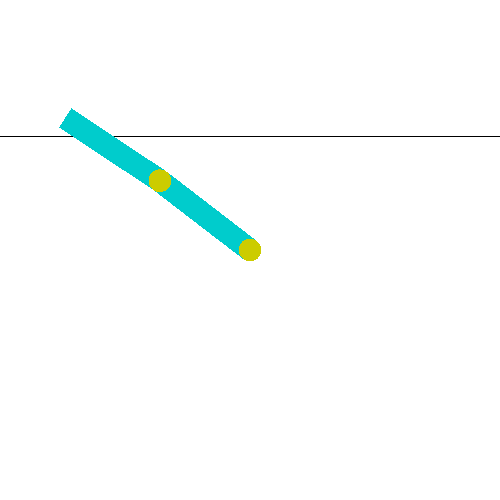

In [76]:
# Render an episode and save as a GIF file
from IPython import display as ipythondisplay
from PIL import Image
from pyvirtualdisplay import Display
from datetime import datetime

display = Display(visible=0, size=(400, 300))
display.start()

def render_episode(env: gym.Env, model: tf.keras.Model, max_steps: int): 
  screen = env.render(mode='rgb_array')
  im = Image.fromarray(screen)

  images = [im]

  state = tf.constant(env.reset(), dtype=tf.float32)
  for i in range(1, 1000 + 1):
    state = tf.expand_dims(state, 0)
    action = agent.act(state, deterministic=True)
    # action = agent.act(state, deterministic=False)

    state, reward, done = tf_env_step(action)
    # state = tf.expand_dims(state, 0)
    # print('reward = {}'.format(reward))
    # Render screen every n steps
    n=1
    if i % n == 0:
      screen = env.render(mode='rgb_array')
      images.append(Image.fromarray(screen))

    if done:
      break

  return images


# Save GIF image
images = render_episode(env, agent.actor, max_steps_per_episode)
image_file = 'Acrobot-v1.gif'
# loop=0: loop forever, duration=1: play each frame for 1ms
images[0].save(
    image_file, save_all=True, append_images=images[1:], loop=0, duration=1)


import tensorflow_docs.vis.embed as embed
embed.embed_file(image_file)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!zip -r /content/file.zip /content/logs/
# from google.colab import files
# files.download("/content/file.zip")

In [71]:
# rm -r logs/

gradient_tape


In [72]:
# %load_ext tensorboard
# %reload_ext tensorboard
%tensorboard --logdir ./logs/gradient_tape/

<IPython.core.display.Javascript object>

In [ ]:
class ActorNet(tf.keras.Model):
  """Actor network."""
  def __init__(self, num_actions: int, num_hidden_units: int):
    """Initialize."""
    super().__init__()
    # self.actor_input = layers.Input(shape=(4))
    self.d1 = layers.Dense(num_hidden_units)
    self.lr1 = layers.LeakyReLU()
    self.d2 = layers.Dense(num_hidden_units)
    self.lr2 = layers.LeakyReLU()
    # self.a = layers.Dense(num_actions, activation='softmax')
    self.a = layers.Dense(num_actions, activation='tanh')
    # self.a = layers.Dense(num_actions, activation='sigmoid')
    # self.a = layers.Dense(num_actions)
    

  def call(self, inputs: tf.Tensor) -> Tuple[tf.Tensor, tf.Tensor]:
    x = self.d1(inputs)
    # x = tf.keras.activations.tanh(x)
    x = self.lr1(x)
    x = self.d2(x)
    x = self.lr2(x)
    return self.a(x)


# inputs = tf.keras.Input(shape=(3,))
# x = tf.keras.layers.Dense(4, activation=tf.nn.relu)(inputs)
# outputs = tf.keras.layers.Dense(5, activation=tf.nn.softmax)(x)
# model = tf.keras.Model(inputs=inputs, outputs=outputs)

model = ActorNet(1,2)
model.build(input_shape=[1, 3])
x = tf.random.uniform((1, 3))
test = model(x)

# model.summary()

In [ ]:
# The function to be traced.
@tf.function
def eval_model(x):
  # A simple hand-rolled layer.
  return model(x)

# Set up logging.
stamp = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
logdir = 'logs/func/%s' % stamp
writer = tf.summary.create_file_writer(logdir)

# Sample data for your function.
x = tf.random.uniform((1, 3))

# Bracket the function call with
# tf.summary.trace_on() and tf.summary.trace_export().
# tf.summary.trace_on(graph=True, profiler=True)
tf.profiler.experimental.stop(logdir)
tf.profiler.experimental.start(logdir)
tf.profiler.experimental.trace("Train", step_num=1):
  z = eval_model(x)
# with writer.as_default():
#   tf.summary.trace_export(
#       name="my_func_trace",
#       step=0,
#       profiler_outdir=logdir)
tf.profiler.experimental.stop(logdir)

# Call only one tf.function when tracing.
# z = eval_model(x)
# with writer.as_default():
#   tf.summary.trace_export(
#       name="my_func_trace",
#       step=0,
#       profiler_outdir=logdir)